<a href="https://colab.research.google.com/github/debstS/London-Real-estate-pricing-for-residential-properties/blob/main/London_Residential_Property_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [13]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

import geocoder as geocoder
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

import folium # map rendering library

print('Libraries imported.')

Libraries imported.


## Web scraping of London Boroughs Data from Wikipedia

In [14]:
!pip install wikipedia

In [31]:
import pandas as pd
import wikipedia as wp

#Get the html source
html = wp.page("List of areas of London").html().encode("UTF-8")
df = pd.read_html(html)[1]
df.head()

,Location,London borough,Post town,Postcode district,Dial code,OS grid ref
0,Abbey Wood,"Bexley, Greenwich [7]",LONDON,SE2,020,TQ465785
1,Acton,"Ealing, Hammersmith and Fulham[8]",LONDON,"W3, W4",020,TQ205805
2,Addington,Croydon[8],CROYDON,CR0,020,TQ375645
3,Addiscombe,Croydon[8],CROYDON,CR0,020,TQ345665
4,Albany Park,Bexley,"BEXLEY, SIDCUP","DA5, DA14",020,TQ478728


In [32]:
df.columns

Index(['Location', 'London borough', 'Post town', 'Postcode district',
       'Dial code', 'OS grid ref'],
      dtype='object')

In [33]:
df.columns = ['Location','London_borough','Post town','Postcode district','Dial Code','OS grid ref']
df.columns

Index(['Location', 'London_borough', 'Post town', 'Postcode district',
       'Dial Code', 'OS grid ref'],
      dtype='object')

## DATA CLEANING

The table contains hyperlinks, and special symbols such as square bracket (ex- Greenwich [2]), etc. Also there are more than one Postal code columns, so we will go with keeping only one.

In [35]:
df['London_borough'] =  df['London_borough'].apply(lambda x: x.replace('[','').replace(']',''))
df['London_borough'] =  df['London_borough'].str.replace('\d+', '')


df['London_borough'] =  df['London_borough'].str.split(',').str[0]
df['Postcode district'] =  df['Postcode district'].str.split(',').str[0]
df['Postcode district'] =  df['Postcode district'].str.split('(').str[0]
df['Post town'] =  df['Post town'].str.split(',').str[0]

<ipython-input-35-232352b9058b>:2: FutureWarning: The default value of regex will change from True to False in a future version.
  df['London_borough'] =  df['London_borough'].str.replace('\d+', '')


In [37]:
df.head(5)

,Location,London_borough,Post town,Postcode district,Dial Code,OS grid ref
0,Abbey Wood,Bexley,LONDON,SE2,020,TQ465785
1,Acton,Ealing,LONDON,W3,020,TQ205805
2,Addington,Croydon,CROYDON,CR0,020,TQ375645
3,Addiscombe,Croydon,CROYDON,CR0,020,TQ345665
4,Albany Park,Bexley,BEXLEY,DA5,020,TQ478728


Saving into a CSV file:-

In [38]:
df.to_csv('london.csv',index=False)

In [40]:
df.shape

(532, 6)

### Scraping Property Data for London to make decisions about areas to buy as a prospective buyer

In [59]:
# tables = pd.read_html("https://propertydata.co.uk/cities/london",header=0)
# df2=pd.DataFrame(data=tables[0])
# df2

## Another methoda below as the above doesn't work

import urllib.request

from urllib.request import Request, urlopen

req = Request(
    url='https://propertydata.co.uk/cities/london',
    headers={'User-Agent': 'Mozilla/5.0'}
)
webpage = urlopen(req).read()


In [60]:
#To store the scraped webpage into a Pandas DataFrame

tables = pd.read_html(webpage,header=0)
df2=pd.DataFrame(data=tables[0])
df2.head(5)


,Postcode district,Avg asking price,Avg rental yield,Sales per month,Avg sold £/sqft,Explore more
0,BR1,"£501,619",4.2%,33.0,£492,Trend Explore
1,BR2,"£596,317",3.9%,34.0,£512,Trend Explore
2,BR3,"£580,901",3.5%,38.0,£532,Trend Explore
3,BR4,"£699,640",-,9.0,£513,Trend Explore
4,BR5,"£469,977",4.7%,35.0,£475,Trend Explore


## Data Cleaning of the Property Data

First, we want to remove unwanted columns. Next, we need to correct price column which is in string format ('£' and commas to be removed)


In [61]:
df2.drop(columns=['Avg rental yield','Avg sold £/sqft','Explore more','Sales per month'],inplace=True)

In [62]:
df2.head()

,Postcode district,Avg asking price
0,BR1,"£501,619"
1,BR2,"£596,317"
2,BR3,"£580,901"
3,BR4,"£699,640"
4,BR5,"£469,977"


### Removing GBP sign and comma from 'Avg asking price' column

In [63]:
df2['Avg asking price'] = df2['Avg asking price'].str.replace("£","")
df2['Avg asking price'] = df2['Avg asking price'].str.replace(',', '')
df2['Avg asking price'] = pd.to_numeric(df2['Avg asking price'])

df2.head(5)

,Postcode district,Avg asking price
0,BR1,501619
1,BR2,596317
2,BR3,580901
3,BR4,699640
4,BR5,469977


In [64]:
df2.to_csv('london_postcode.csv',index=False)

# Merge the 'London Boroughs' and 'London Property Prices' dataframes

We are using inner join here because there were many postcodes that were not in the London Borough's dataframe, and we want to make sure we are fetching prices of only London Boroughs dataframe.

In [67]:
data = pd.merge(df, df2, how='inner', left_on='Postcode district', right_on='Postcode district')

# Finding Longitude and Latitude of the Locations


In [68]:
def getLatLong(row):
    # initialize your variable to None
    lat_lng_coords = None
    search_query = '{}, London,UK'.format(row)
    # loop until you get the coordinates
    try:
        while(lat_lng_coords is None):
            #g = geocoder.here(search_query,app_id=app_id,app_code=app_code)
            g = geocoder.arcgis(search_query)
            lat_lng_coords = g.latlng
            #print('FIRST')
    except IndexError:
        latitude = 0.0
        longitude = 0.0
        print('BACKUP')
        return [latitude,longitude]

    latitude = lat_lng_coords[0]
    longitude = lat_lng_coords[1]
    print(latitude, longitude)
    return [latitude, longitude]

In [69]:
coords_list = data['Postcode district'].apply(getLatLong).tolist()

51.499741613000026 0.12406168200004686
51.499741613000026 0.12406168200004686
51.499741613000026 0.12406168200004686
51.521205000000066 -0.27397542799997154
51.38475500000004 -0.05149847299992416
51.38475500000004 -0.05149847299992416
51.38475500000004 -0.05149847299992416
51.38475500000004 -0.05149847299992416
51.38475500000004 -0.05149847299992416
51.38475500000004 -0.05149847299992416
51.38475500000004 -0.05149847299992416
51.38475500000004 -0.05149847299992416
51.38475500000004 -0.05149847299992416
51.507408360000056 -0.12769869299995662
51.507408360000056 -0.12769869299995662
51.507408360000056 -0.12769869299995662
51.507408360000056 -0.12769869299995662
51.507408360000056 -0.12769869299995662
51.51462500100007 -0.11486033199997792
51.51462500100007 -0.11486033199997792
51.51462500100007 -0.11486033199997792
51.51462500100007 -0.11486033199997792
51.507408360000056 -0.12769869299995662
51.507408360000056 -0.12769869299995662
51.507408360000056 -0.12769869299995662
51.4824900010000

## Merging the values in the dataframe



In [70]:
data[['Latitude','Longitude']]=pd.DataFrame(coords_list,columns=['Latitude', 'Longitude'])
data.head()

,Location,London_borough,Post town,Postcode district,Dial Code,OS grid ref,Avg asking price,Latitude,Longitude
0,Abbey Wood,Bexley,LONDON,SE2,020,TQ465785,407458,51.499742,0.124062
1,Crossness,Bexley,LONDON,SE2,020,TQ480800,407458,51.499742,0.124062
2,West Heath,Bexley,LONDON,SE2,020,TQ475775,407458,51.499742,0.124062
3,Acton,Ealing,LONDON,W3,020,TQ205805,521516,51.521205,-0.273975
4,Addington,Croydon,CROYDON,CR0,020,TQ375645,382801,51.384755,-0.051498


## Droping unwanted columns

In [71]:
data.drop(columns=['Post town','Dial Code','OS grid ref'],inplace=True)

#### Use geopy library to get the latitude and longitude values of London.

In [72]:
address = 'London'

geolocator = Nominatim(user_agent="ldn_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of London are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of London are 51.5073359, -0.12765.


## Create a map of London with neighborhoods superimposed on top.

In [73]:
map_london = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(data['Latitude'], data['Longitude'], data['London_borough'], data['Location']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_london)

map_london

Next, utilizing the Foursquare API to explore the neighborhoods and segment them.

## Define Foursquare Credentials and Version

In [74]:
CLIENT_ID = 'U0OWUYRP10WK5UFHIVQGDEKRQLZBSFYRALYTWAF0OBVJHIZ4' # your Foursquare ID
CLIENT_SECRET = 'R2BLV2WI204CLFJ5GTAS1OR0U2AFMKZV5UTWI20OREP30SZQ' # your Foursquare Secret
VERSION = '20180604'

In [75]:
def getBuiltUrl(neigh_lat,neigh_long,radius=1400):
    # type your answer here
    LIMIT=100
    #radius=1000
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID,
    CLIENT_SECRET,
    VERSION,
    neigh_lat,
    neigh_long,
    radius,
    LIMIT)
    return url

## Exploring first Location in our dataframe

In [76]:
neigh_name, neigh_borough, neigh_post, neigh_price, neigh_lat, neigh_long = data.iloc[0]
print('Latitude and longitude values of {} are {}, {}.'.format(neigh_name,
                                                               neigh_lat,
                                                               neigh_long))
results = requests.get(getBuiltUrl(neigh_lat,neigh_long)).json()
results

Latitude and longitude values of Abbey Wood are 51.499741613000026, 0.12406168200004686.


{'meta': {'code': 200, 'requestId': '65078d153c098c236072d94d'},
 'response': {'queryRefinements': {'target': {'type': 'path',
    'url': '/venue/explore',
    'params': {'ll': '51.499742,0.124062', 'radius': '1400'}},
   'refinements': [{'query': 'Food'},
    {'query': 'Nightlife'},
    {'query': 'Coffee'},
    {'query': 'Shops'},
    {'query': 'Arts'},
    {'query': 'Outdoors'}]},
  'headerLocation': 'Thamesmead East',
  'headerFullLocation': 'Thamesmead East, London',
  'headerLocationGranularity': 'neighborhood',
  'totalResults': 11,
  'suggestedBounds': {'ne': {'lat': 51.51234162560004,
    'lng': 0.14426428430527385},
   'sw': {'lat': 51.487141600400015, 'lng': 0.10385907969481985}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4b33a6a9f964a520241c25e3',
      

In [77]:
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']

    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

#### Now cleaning the json file and structure it into a *pandas* dataframe.

In [78]:
venues = results['response']['groups'][0]['items']

nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

<ipython-input-78-561c05f0fdd1>:3: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead.
  nearby_venues = json_normalize(venues) # flatten JSON


,name,categories,lat,lng
0,The Abbey Arms,Pub,51.490693,0.121182
1,Lesnes Abbey,Historic and Protected Site,51.489526,0.125839
2,Sainsbury's,Supermarket,51.492826,0.120524
3,Lidl,Supermarket,51.496152,0.118417
4,BP,Fuel Station,51.492929,0.121520


In [79]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

11 venues were returned by Foursquare.


# Function to repeat the same process for all the neighborhoods in London::

In [80]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):

    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)

        # create the API request URL
        LIMIT=100
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID,
            CLIENT_SECRET,
            VERSION,
            lat,
            lng,
            radius,
            LIMIT)

        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']

        # return only relevant information for each nearby venue
        venues_list.append([(
            name,
            lat,
            lng,
            v['venue']['name'],
            v['venue']['location']['lat'],
            v['venue']['location']['lng'],
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood',
                  'Neighborhood Latitude',
                  'Neighborhood Longitude',
                  'Venue',
                  'Venue Latitude',
                  'Venue Longitude',
                  'Venue Category']

    return(nearby_venues)

#### Running our function for all Location in the dataframe

In [81]:
london_venues = getNearbyVenues(names=data['Location'],
                                   latitudes=data['Latitude'],
                                   longitudes=data['Longitude'],
                                   radius=500)

Abbey Wood
Crossness
West Heath
Acton
Addington
Addiscombe
Coombe
Croydon
Forestdale
New Addington
Shirley
Waddon
Woodside
Albany Park
Bexley (also Old Bexley, Bexley Village)
Aldborough Hatch
Gants Hill
Newbury Park
Aldwych
Charing Cross
Covent Garden
St Giles
Alperton
Sudbury
Wembley
Anerley
Penge
Angel
Barbican
Clerkenwell
Farringdon
Finsbury
St Luke's
Aperfield
Biggin Hill
Archway
Upper Holloway
Ardleigh Green
Emerson Park
Hornchurch
Arkley
Barnet (also Chipping Barnet, High Barnet)
Monken Hadley
Arnos Grove
Bounds Green
Brunswick Park
Colney Hatch
Friern Barnet
New Southgate
Balham
Bankside
Bermondsey
Elephant and Castle
Lambeth
Newington
Barking
Creekmouth
Barkingside
Barnehurst
Barnes
Castelnau
Barnes Cray
Crayford
Barnet Gate
The Hale
Mill Hill
Barnsbury
Canonbury
De Beauvoir Town
Hoxton
Islington
Pentonville
Shoreditch
Battersea
Bayswater
Paddington
Beckenham
Bickley
Bromley Common
Eden Park
Elmers End
Beckton
East Ham
Upton Park
Becontree
Castle Green
Dagenham
Becontree Heath

In [82]:
print(london_venues.shape)
london_venues.head()

(22197, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Abbey Wood,51.499742,0.124062,Southmere Lake,51.500381,0.125012,Lake
1,Abbey Wood,51.499742,0.124062,Yarnton way,51.496292,0.125028,Hiking Trail
2,Crossness,51.499742,0.124062,Southmere Lake,51.500381,0.125012,Lake
3,Crossness,51.499742,0.124062,Yarnton way,51.496292,0.125028,Hiking Trail
4,West Heath,51.499742,0.124062,Southmere Lake,51.500381,0.125012,Lake


### Venues returned for each Neighborhood Location

In [83]:
london_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Abbey Wood,2,2,2,2,2,2
Acton,6,6,6,6,6,6
Addington,1,1,1,1,1,1
Addiscombe,1,1,1,1,1,1
Albany Park,100,100,100,100,100,100
Aldborough Hatch,100,100,100,100,100,100
Aldwych,100,100,100,100,100,100
Alperton,100,100,100,100,100,100
Anerley,3,3,3,3,3,3


In [85]:
print('There are {} uniques categories.'.format(len(london_venues['Venue Category'].unique())))

There are 304 uniques categories.


## Analyzing each Neighborhood Location

In [86]:
# one hot encoding
london_onehot = pd.get_dummies(london_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
london_onehot['Neighborhood'] = london_venues['Neighborhood']

# move neighborhood column to the first column
fixed_columns = [london_onehot.columns[-1]] + list(london_onehot.columns[:-1])
london_onehot = london_onehot[fixed_columns]

london_onehot.head()

,Winery,Adult Store,African Restaurant,American Restaurant,Antique Store,Apartment or Condo,Aquarium,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts and Crafts Store,Arts and Entertainment,Asian Restaurant,Auction House,Australian Restaurant,Austrian Restaurant,Automotive Repair Shop,BBQ Joint,Bagel Shop,Bakery,Bar,Bathing Area,Beach,Bed and Breakfast,Beer Bar,Beer Garden,Beer Store,Betting Shop,Bicycle Store,Bike Rental,Bistro,Boarding House,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridge,Burger Joint,Burrito Restaurant,Bus Station,Bus Stop,Café,Camera Store,Campground,Canal,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Carpet Store,Casino,Caucasian Restaurant,Cave,Chaat Place,Champagne Bar,Cheese Store,Chinese Restaurant,Chocolate Store,Church,Circus School,Clothing Store,Cocktail Bar,Coffee Roaster,Coffee Shop,College Cafeteria,College Quad,Comedy Club,Comic Book Store,Concert Hall,Convenience Store,Convention Center,Cosmetics Store,Costume Store,Creperie,Cupcake Shop,Dance Studio,Deli,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doner Restaurant,Donut Shop,Dumpling Restaurant,Education,Electronics Store,Empanada Restaurant,English Restaurant,Escape Room,Ethiopian Restaurant,Event Space,Exhibit,Eyecare Store,Falafel Restaurant,Farm,Farmers Market,Fashion Accessories Store,Fast Food Restaurant,Filipino Restaurant,Fish Market,Fish and Chips Shop,Flea Market,Flower Store,Food Court,Food Stand,Food Truck,Food and Beverage Retail,Forest,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit and Vegetable Store,Fuel Station,Furniture and Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,Gay Bar,Gelato Shop,Gift Store,Gourmet Store,Greek Restaurant,Grocery Store,Hair Salon,Halal Restaurant,Harbor or Marina,Hardware Store,Health and Beauty Service,Herbs and Spices Store,Hiking Trail,Hill,Himalayan Restaurant,Historic and Protected Site,History Museum,Hobby Store,Hookah Bar,Hostel,Hotel,Hotel Bar,Hotpot Restaurant,Housing Development,Hunan Restaurant,Ice Cream Parlor,Imported Food Store,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Internet Cafe,Iraqi Restaurant,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz and Blues Venue,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kitchen Supply Store,Korean Restaurant,Lake,Landmarks and Outdoors,Laser Tag Center,Latin American Restaurant,Law School,Lebanese Restaurant,Library,Light Rail Station,Lighting Store,Liquor Store,Lounge,Mac and Cheese Joint,Malay Restaurant,Mamak Restaurant,Market,Mediterranean Restaurant,Memorial Site,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf Course,Miscellaneous Store,Mobile Phone Store,Modern European Restaurant,Monument,Moroccan Restaurant,Motorcycle Dealership,Movie Theater,Museum,Music Store,Music Venue,Neighborhood,New American Restaurant,Newsagent,Night Club,Noodle Restaurant,North Indian Restaurant,Office Supply Store,Okonomiyaki Restaurant,Organic Grocery,Outdoor Event Space,Outdoor Sculpture,Pakistani Restaurant,Palace,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Store,Persian Restaurant,Peruvian Restaurant,Pet Supplies Store,Pharmacy,Pie Shop,Pier,Pizzeria,Platform,Playground,Plaza,Polish Restaurant,Portuguese Restaurant,Print Store,Pub,Public Art,Race Track,Rail Station,Ramen Restaurant,Record Store,Recreation Center,Rental Car Location,Reservoir,Restaurant,Retail,River,Road,Rock Climbing Spot,Rock Club,Roof Deck,Russian Restaurant,Salad Restaurant,Sandwich Spot,Scandinavian Restaurant,Scenic Lookout,Science Museum,Sculpture Garden,Seafood Restaurant,Shaanxi Restaurant,Shoe Store,Shopping Mall,Shopping Plaza,Skate Store,Snack Place,Soccer Stadium,Social Club,South American Restaurant,Souvenir Store,Souvlaki Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Retail,Sports Bar,Sports and Recre

In [87]:
london_onehot.shape

(22197, 304)

###  Grouping rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [88]:
london_grouped = london_onehot.groupby('Neighborhood').mean().reset_index()
london_grouped

,Neighborhood,Winery,Adult Store,African Restaurant,American Restaurant,Antique Store,Apartment or Condo,Aquarium,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts and Crafts Store,Arts and Entertainment,Asian Restaurant,Auction House,Australian Restaurant,Austrian Restaurant,Automotive Repair Shop,BBQ Joint,Bagel Shop,Bakery,Bar,Bathing Area,Beach,Bed and Breakfast,Beer Bar,Beer Garden,Beer Store,Betting Shop,Bicycle Store,Bike Rental,Bistro,Boarding House,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridge,Burger Joint,Burrito Restaurant,Bus Station,Bus Stop,Café,Camera Store,Campground,Canal,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Carpet Store,Casino,Caucasian Restaurant,Cave,Chaat Place,Champagne Bar,Cheese Store,Chinese Restaurant,Chocolate Store,Church,Circus School,Clothing Store,Cocktail Bar,Coffee Roaster,Coffee Shop,College Cafeteria,College Quad,Comedy Club,Comic Book Store,Concert Hall,Convenience Store,Convention Center,Cosmetics Store,Costume Store,Creperie,Cupcake Shop,Dance Studio,Deli,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doner Restaurant,Donut Shop,Dumpling Restaurant,Education,Electronics Store,Empanada Restaurant,English Restaurant,Escape Room,Ethiopian Restaurant,Event Space,Exhibit,Eyecare Store,Falafel Restaurant,Farm,Farmers Market,Fashion Accessories Store,Fast Food Restaurant,Filipino Restaurant,Fish Market,Fish and Chips Shop,Flea Market,Flower Store,Food Court,Food Stand,Food Truck,Food and Beverage Retail,Forest,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit and Vegetable Store,Fuel Station,Furniture and Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,Gay Bar,Gelato Shop,Gift Store,Gourmet Store,Greek Restaurant,Grocery Store,Hair Salon,Halal Restaurant,Harbor or Marina,Hardware Store,Health and Beauty Service,Herbs and Spices Store,Hiking Trail,Hill,Himalayan Restaurant,Historic and Protected Site,History Museum,Hobby Store,Hookah Bar,Hostel,Hotel,Hotel Bar,Hotpot Restaurant,Housing Development,Hunan Restaurant,Ice Cream Parlor,Imported Food Store,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Internet Cafe,Iraqi Restaurant,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz and Blues Venue,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kitchen Supply Store,Korean Restaurant,Lake,Landmarks and Outdoors,Laser Tag Center,Latin American Restaurant,Law School,Lebanese Restaurant,Library,Light Rail Station,Lighting Store,Liquor Store,Lounge,Mac and Cheese Joint,Malay Restaurant,Mamak Restaurant,Market,Mediterranean Restaurant,Memorial Site,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf Course,Miscellaneous Store,Mobile Phone Store,Modern European Restaurant,Monument,Moroccan Restaurant,Motorcycle Dealership,Movie Theater,Museum,Music Store,Music Venue,New American Restaurant,Newsagent,Night Club,Noodle Restaurant,North Indian Restaurant,Office Supply Store,Okonomiyaki Restaurant,Organic Grocery,Outdoor Event Space,Outdoor Sculpture,Pakistani Restaurant,Palace,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Store,Persian Restaurant,Peruvian Restaurant,Pet Supplies Store,Pharmacy,Pie Shop,Pier,Pizzeria,Platform,Playground,Plaza,Polish Restaurant,Portuguese Restaurant,Print Store,Pub,Public Art,Race Track,Rail Station,Ramen Restaurant,Record Store,Recreation Center,Rental Car Location,Reservoir,Restaurant,Retail,River,Road,Rock Climbing Spot,Rock Club,Roof Deck,Russian Restaurant,Salad Restaurant,Sandwich Spot,Scandinavian Restaurant,Scenic Lookout,Science Museum,Sculpture Garden,Seafood Restaurant,Shaanxi Restaurant,Shoe Store,Shopping Mall,Shopping Plaza,Skate Store,Snack Place,Soccer Stadium,Social Club,South American Restaurant,Souvenir Store,Souvlaki Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Retail,Sports Bar,Sports and Recre

In [89]:
a=london_grouped
a.head()

,Neighborhood,Winery,Adult Store,African Restaurant,American Restaurant,Antique Store,Apartment or Condo,Aquarium,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts and Crafts Store,Arts and Entertainment,Asian Restaurant,Auction House,Australian Restaurant,Austrian Restaurant,Automotive Repair Shop,BBQ Joint,Bagel Shop,Bakery,Bar,Bathing Area,Beach,Bed and Breakfast,Beer Bar,Beer Garden,Beer Store,Betting Shop,Bicycle Store,Bike Rental,Bistro,Boarding House,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridge,Burger Joint,Burrito Restaurant,Bus Station,Bus Stop,Café,Camera Store,Campground,Canal,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Carpet Store,Casino,Caucasian Restaurant,Cave,Chaat Place,Champagne Bar,Cheese Store,Chinese Restaurant,Chocolate Store,Church,Circus School,Clothing Store,Cocktail Bar,Coffee Roaster,Coffee Shop,College Cafeteria,College Quad,Comedy Club,Comic Book Store,Concert Hall,Convenience Store,Convention Center,Cosmetics Store,Costume Store,Creperie,Cupcake Shop,Dance Studio,Deli,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Doner Restaurant,Donut Shop,Dumpling Restaurant,Education,Electronics Store,Empanada Restaurant,English Restaurant,Escape Room,Ethiopian Restaurant,Event Space,Exhibit,Eyecare Store,Falafel Restaurant,Farm,Farmers Market,Fashion Accessories Store,Fast Food Restaurant,Filipino Restaurant,Fish Market,Fish and Chips Shop,Flea Market,Flower Store,Food Court,Food Stand,Food Truck,Food and Beverage Retail,Forest,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit and Vegetable Store,Fuel Station,Furniture and Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,Gay Bar,Gelato Shop,Gift Store,Gourmet Store,Greek Restaurant,Grocery Store,Hair Salon,Halal Restaurant,Harbor or Marina,Hardware Store,Health and Beauty Service,Herbs and Spices Store,Hiking Trail,Hill,Himalayan Restaurant,Historic and Protected Site,History Museum,Hobby Store,Hookah Bar,Hostel,Hotel,Hotel Bar,Hotpot Restaurant,Housing Development,Hunan Restaurant,Ice Cream Parlor,Imported Food Store,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Internet Cafe,Iraqi Restaurant,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz and Blues Venue,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kitchen Supply Store,Korean Restaurant,Lake,Landmarks and Outdoors,Laser Tag Center,Latin American Restaurant,Law School,Lebanese Restaurant,Library,Light Rail Station,Lighting Store,Liquor Store,Lounge,Mac and Cheese Joint,Malay Restaurant,Mamak Restaurant,Market,Mediterranean Restaurant,Memorial Site,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf Course,Miscellaneous Store,Mobile Phone Store,Modern European Restaurant,Monument,Moroccan Restaurant,Motorcycle Dealership,Movie Theater,Museum,Music Store,Music Venue,New American Restaurant,Newsagent,Night Club,Noodle Restaurant,North Indian Restaurant,Office Supply Store,Okonomiyaki Restaurant,Organic Grocery,Outdoor Event Space,Outdoor Sculpture,Pakistani Restaurant,Palace,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Store,Persian Restaurant,Peruvian Restaurant,Pet Supplies Store,Pharmacy,Pie Shop,Pier,Pizzeria,Platform,Playground,Plaza,Polish Restaurant,Portuguese Restaurant,Print Store,Pub,Public Art,Race Track,Rail Station,Ramen Restaurant,Record Store,Recreation Center,Rental Car Location,Reservoir,Restaurant,Retail,River,Road,Rock Climbing Spot,Rock Club,Roof Deck,Russian Restaurant,Salad Restaurant,Sandwich Spot,Scandinavian Restaurant,Scenic Lookout,Science Museum,Sculpture Garden,Seafood Restaurant,Shaanxi Restaurant,Shoe Store,Shopping Mall,Shopping Plaza,Skate Store,Snack Place,Soccer Stadium,Social Club,South American Restaurant,Souvenir Store,Souvlaki Shop,Spa,Spanish Restaurant,Speakeasy,Sporting Goods Retail,Sports Bar,Sports and Recre

### Top 5 most common venues for each Neighborhood

In [90]:
num_top_venues = 5

for hood in a['Neighborhood']:
    print("----"+hood+"----")
    temp = a[a['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Abbey Wood----
                    venue  freq
0                    Lake   0.5
1            Hiking Trail   0.5
2                  Winery   0.0
3     Outdoor Event Space   0.0
4  Okonomiyaki Restaurant   0.0


----Acton----
               venue  freq
0     Hardware Store  0.17
1               Café  0.17
2               Park  0.17
3       Flower Store  0.17
4  Recreation Center  0.17


----Addington----
                     venue  freq
0            Grocery Store   1.0
1                   Winery   0.0
2  New American Restaurant   0.0
3   Okonomiyaki Restaurant   0.0
4      Office Supply Store   0.0


----Addiscombe----
                     venue  freq
0            Grocery Store   1.0
1                   Winery   0.0
2  New American Restaurant   0.0
3   Okonomiyaki Restaurant   0.0
4      Office Supply Store   0.0


----Albany Park----
                venue  freq
0             Theater  0.12
1               Hotel  0.06
2               Plaza  0.04
3  Italian Restaurant  0.04
4          S

<ipython-input-90-242fa11f83d7>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp['freq'] = temp['freq'].astype(float)


           venue  freq
0    Coffee Shop  0.10
1            Pub  0.09
2          Hotel  0.07
3        Theater  0.07
4  Sandwich Spot  0.05


----St Helier----
           venue  freq
0            Pub  0.25
1           Café  0.25
2  Grocery Store  0.25
3  Garden Center  0.25
4         Winery  0.00


----St James's----
      venue  freq
0       Pub  0.10
1     Hotel  0.10
2    Bakery  0.08
3  Pizzeria  0.06
4      Park  0.06


----St John's Wood----
                       venue  freq
0                       Café  0.22
1                     Bakery  0.11
2                 Wine Store  0.06
3         Italian Restaurant  0.06
4  Middle Eastern Restaurant  0.06


----St Johns----
           venue  freq
0           Café  0.22
1       Beer Bar  0.11
2           Park  0.11
3   Cocktail Bar  0.11
4  Grocery Store  0.11


----St Luke's----
                             venue  freq
0                      Coffee Shop  0.09
1                             Café  0.07
2                              Pub  0.06

## Put 'Most Common Venues' in a Dataframe

In [91]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)

    return row_categories_sorted.index.values[0:num_top_venues]

#### Create the new dataframe and display the top 10 venues for each neighborhood.

In [92]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = a['Neighborhood']

for ind in np.arange(a.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(a.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Abbey Wood,Lake,Hiking Trail,Winery,Outdoor Event Space,Okonomiyaki Restaurant,Office Supply Store,North Indian Restaurant,Noodle Restaurant,Night Club,Newsagent
1,Acton,Hardware Store,Café,Park,Flower Store,Recreation Center,Music Venue,Newsagent,Okonomiyaki Restaurant,Office Supply Store,North Indian Restaurant
2,Addington,Grocery Store,Winery,New American Restaurant,Okonomiyaki Restaurant,Office Supply Store,North Indian Restaurant,Noodle Restaurant,Night Club,Newsagent,Music Venue
3,Addiscombe,Grocery Store,Winery,New American Restaurant,Okonomiyaki Restaurant,Office Supply Store,North Indian Restaurant,Noodle Restaurant,Night Club,Newsagent,Music Venue
4,Albany Park,Theater,Hotel,Plaza,Italian Restaurant,Steakhouse,Garden,Cocktail Bar,Ice Cream Parlor,Monument,Art Gallery


In [93]:
neighborhoods_venues_sorted.rename(columns = {'Neighborhood':'Location'}, inplace = True)

## Adding Average house price of each Neighborhood in the Group
### Normalizing the Avg price column

In [95]:
a['Price']=data['Avg asking price']
v= a.iloc[:, -1]
a.iloc[:,-1] = (v - v.min()) / (v.max() - v.min())




# Clustering Neighborhoods

Running K-means clustering for 4 clusters

In [97]:
kclusters = 6

london_grouped_clustering = a.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(london_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

<ipython-input-97-17c0ebd13926>:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  london_grouped_clustering = a.drop('Neighborhood', 1)
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


array([1, 1, 3, 3, 1, 1, 1, 1, 1, 1], dtype=int32)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

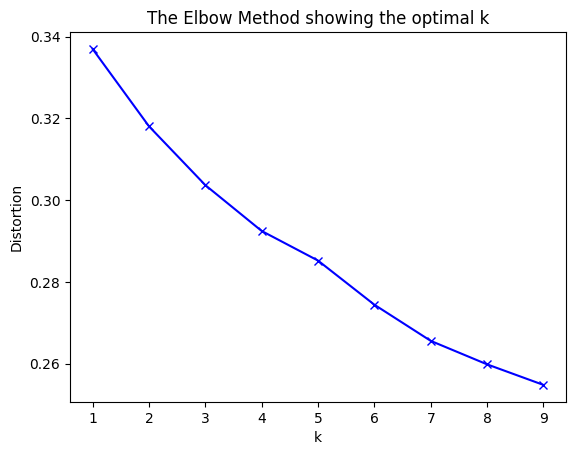

In [100]:
from sklearn import metrics
from scipy.spatial.distance import cdist
import numpy as np
import matplotlib.pyplot as plt

# k means determine k
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k).fit(london_grouped_clustering)
    kmeanModel.fit(london_grouped_clustering)
    distortions.append(sum(np.min(cdist(london_grouped_clustering, kmeanModel.cluster_centers_, 'euclidean'), axis=1)) / london_grouped_clustering.shape[0])

# Plot the elbow
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [102]:
#neighborhoods_venues_sorted.drop(columns = 'Cluster Labels', inplace = True)

#### Create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.

In [103]:
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

london_merged = data

london_merged = london_merged.join(neighborhoods_venues_sorted.set_index('Location'), on='Location')

london_merged

,Location,London_borough,Postcode district,Avg asking price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Abbey Wood,Bexley,SE2,407458,51.499742,0.124062,1.0,Lake,Hiking Trail,Winery,Outdoor Event Space,Okonomiyaki Restaurant,Office Supply Store,North Indian Restaurant,Noodle Restaurant,Night Club,Newsagent
1,Crossness,Bexley,SE2,407458,51.499742,0.124062,1.0,Lake,Hiking Trail,Winery,Outdoor Event Space,Okonomiyaki Restaurant,Office Supply Store,North Indian Restaurant,Noodle Restaurant,Night Club,Newsagent
2,West Heath,Bexley,SE2,407458,51.499742,0.124062,1.0,Lake,Hiking Trail,Winery,Outdoor Event Space,Okonomiyaki Restaurant,Office Supply Store,North Indian Restaurant,Noodle Restaurant,Night Club,Newsagent
3,Acton,Ealing,W3,521516,51.521205,-0.273975,1.0,Hardware Store,Café,Park,Flower Store,Recreation Center,Music Venue,Newsagent,Okonomiyaki Restaurant,Office Supply Store,North Indian Restaurant
4,Addington,Croydon,CR0,382801,51.384755,-0.051498,3.0,Grocery Store,Winery,New American Restaurant,Okonomiyaki Restaurant,Office Supply Store,North Indian Restaurant,Noodle Restaurant,Night Club,Newsagent,Music Venue
5,Addiscombe,Croydon,CR0,382801,51.384755,-0.051498,3.0,Grocery Store,Winery,New American Restaurant,Okonomiyaki Restaurant,Office Supply Store,North Indian Restaurant,Noodle Restaurant,Night Club,Newsagent,Music Venue
6,Coombe,Croydon,CR0,382801,51.384755,-0.051498,1.0,Café,Hotel,Pub,Thai Restaurant,Burger Joint,Sushi Restaurant,Coffee Shop,Clothing Store,Rock Club,Bookstore
7,Croydon,Croydon,CR0,382801,51.384755,-0.051498,3.0,Grocery Store,Winery,New American Restaurant,Okonomiyaki Restaurant,Office Supply Store,North Indian Restaurant,Noodle Restaurant,Night Club,Newsagent,Music Venue
8,Forestdale,Croydon,CR0,382801,51.384755,-0.051498,3.0,Grocery Store,Winery,New American Restaurant,Okonomiyaki Restaurant,Office Supply Store,North Indian Restaurant,Noodle Restaurant,Night Club,Newsagent,Music Venue
9,New Addington,Croydon,CR0,382801,51.384755,-0.051498,3.0,Grocery Store,Winery,New American Restaurant,Okonomiyaki Restaurant,Office Supply Store,North Indian Restaurant,Noodle Restaurant,Night Club,Newsagent,Music Venue


##### There was null value in the merged data so droping the rows with null values

In [104]:
london_merged.dropna(inplace=True)

##### Because of null values the data type of 'Cluster Labels' was changed from int to float so converting it back to int

In [105]:
london_merged['Cluster Labels'] = london_merged['Cluster Labels'].astype(int)
london_merged.dtypes

Location                   object
London_borough             object
Postcode district          object
Avg asking price            int64
Latitude                  float64
Longitude                 float64
Cluster Labels              int64
1st Most Common Venue      object
2nd Most Common Venue      object
3rd Most Common Venue      object
4th Most Common Venue      object
5th Most Common Venue      object
6th Most Common Venue      object
7th Most Common Venue      object
8th Most Common Venue      object
9th Most Common Venue      object
10th Most Common Venue     object
dtype: object

### There were many Location that were assigned the same postcodes as they were very near, hence droping the duplicate postcodes

In [107]:
london_merged.drop_duplicates(subset='Postcode district',inplace=True)

In [113]:
london_merged.reset_index(inplace=True)
london_merged.drop(columns='index',inplace=True)


# Visualize the clusters

In [109]:
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(london_merged['Latitude'],london_merged['Longitude'], london_merged['Location'], london_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=3,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)

map_clusters

# Binning

### There is the range of Avg price so binned the price into 7 distinct values
##### ('Low level 1', 'Low level 2', 'Average level 1', 'Average level 2','Above Average','High level 1','High level 2')

Visualizing the bins

Text(0.5, 1.0, 'Price bins')

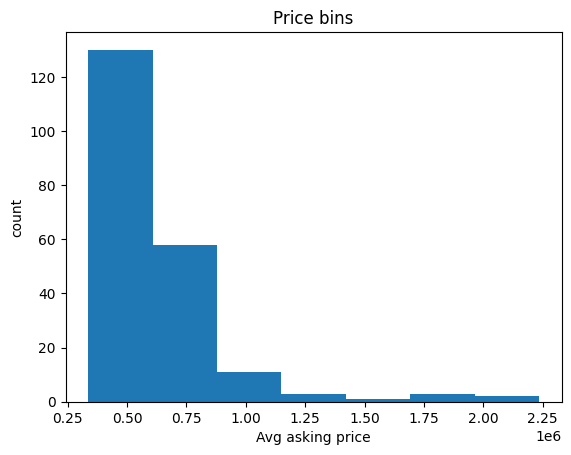

In [114]:
%matplotlib inline
import matplotlib as plt
from matplotlib import pyplot
plt.pyplot.hist(london_merged["Avg asking price"],bins=7)

# set x/y labels and plot title
plt.pyplot.xlabel("Avg asking price")
plt.pyplot.ylabel("count")
plt.pyplot.title("Price bins")

In [116]:
bins = np.linspace(min(london_merged["Avg asking price"]), max(london_merged["Avg asking price"]), 8)
bins

array([ 336185.        ,  607507.85714286,  878830.71428571,
       1150153.57142857, 1421476.42857143, 1692799.28571429,
       1964122.14285714, 2235445.        ])

In [119]:
group_names = ['Low level 1', 'Low level 2', 'Average level 1', 'Average level 2','Above Average','High level 1','High level 2']

In [120]:
london_merged['Price-Categories'] = pd.cut(london_merged['Avg asking price'], bins, labels=group_names, include_lowest=True )
london_merged[['Avg asking price','Price-Categories']].head()

,Avg asking price,Price-Categories
0,407458,Low level 1
1,521516,Low level 1
2,382801,Low level 1
3,566238,Low level 1
4,480056,Low level 1


## Cluster bins
### Creating 4 bins for clusters

Text(0.5, 1.0, 'Cluster Labels')

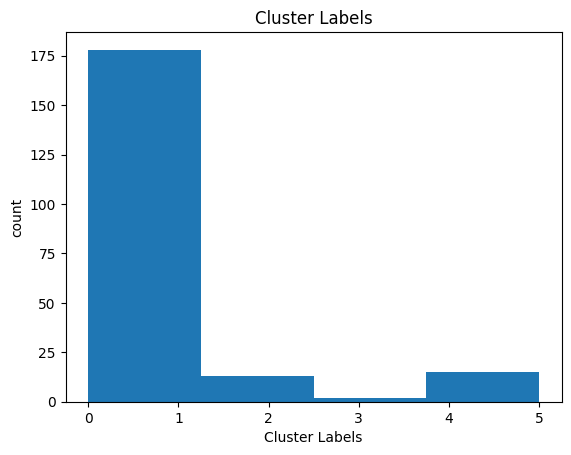

In [121]:
plt.pyplot.hist(london_merged["Cluster Labels"],bins=4)

# set x/y labels and plot title
plt.pyplot.xlabel("Cluster Labels")
plt.pyplot.ylabel("count")
plt.pyplot.title("Cluster Labels")

In [122]:
bins = np.linspace(min(london_merged["Cluster Labels"]), max(london_merged["Cluster Labels"]), 7)
bins

array([0.        , 0.83333333, 1.66666667, 2.5       , 3.33333333,
       4.16666667, 5.        ])

In [123]:
group_names = ['Mixed Social Venues','Hotels and Social Venues','Stores and seafood restaurants','Pubs and Historic places', 'Sports and Athletics','Restaurants and Bars']

In [124]:
london_merged['Cluster-Category'] = pd.cut(london_merged['Cluster Labels'], bins, labels=group_names, include_lowest=True )
london_merged[['Cluster Labels','Cluster-Category']].head()

,Cluster Labels,Cluster-Category
0,1,Hotels and Social Venues
1,1,Hotels and Social Venues
2,3,Pubs and Historic places
3,1,Hotels and Social Venues
4,1,Hotels and Social Venues


# Final Data

In [126]:
london_merged.drop(columns=['6th Most Common Venue','7th Most Common Venue','8th Most Common Venue','9th Most Common Venue','10th Most Common Venue'],inplace=True)
london_merged.head(20)

,Location,London_borough,Postcode district,Avg asking price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Price-Categories,Cluster-Category
0,Abbey Wood,Bexley,SE2,407458,51.499742,0.124062,1,Lake,Hiking Trail,Winery,Outdoor Event Space,Okonomiyaki Restaurant,Low level 1,Hotels and Social Venues
1,Acton,Ealing,W3,521516,51.521205,-0.273975,1,Hardware Store,Café,Park,Flower Store,Recreation Center,Low level 1,Hotels and Social Venues
2,Addington,Croydon,CR0,382801,51.384755,-0.051498,3,Grocery Store,Winery,New American Restaurant,Okonomiyaki Restaurant,Office Supply Store,Low level 1,Pubs and Historic places
3,Albany Park,Bexley,DA5,566238,51.507408,-0.127699,1,Theater,Hotel,Plaza,Italian Restaurant,Steakhouse,Low level 1,Hotels and Social Venues
4,Aldborough Hatch,Redbridge,IG2,480056,51.507408,-0.127699,1,Theater,Hotel,Plaza,Italian Restaurant,Steakhouse,Low level 1,Hotels and Social Venues
5,Aldwych,Westminster,WC2,1623602,51.514625,-0.114860,1,Coffee Shop,Pub,Hotel,Theater,Sandwich Spot,Above Average,Hotels and Social Venues
6,Alperton,Brent,HA0,541204,51.507408,-0.127699,1,Theater,Hotel,Plaza,Italian Restaurant,Steakhouse,Low level 1,Hotels and Social Venues
7,Anerley,Bromley,SE20,403248,51.482490,0.119194,1,Forest,Bus Stop,Campground,Winery,New American Restaurant,Low level 1,Hotels and Social Venues
8,Angel,Islington,EC1,839566,51.530130,-0.107969,1,Coffee Shop,Café,Pub,Vegan and Vegetarian Restaurant,Indian Restaurant,Low level 2,Hotels and Social Venues
9,Aperfield,Bromley,TN16,558248,51.276121,0.074362,1,Taxi Stand,Fuel Station,Winery,Music Store,North Indian Restaurant,Low level 1,Hotels and Social Venues


# Creating Choropleth map to visualize how London is divided in terms of Housing prices and cluster markers on the top

In [134]:
lnd_geo = r'london_boroughs_proper.geojson'
lnd_map = folium.Map(location = [latitude, longitude], zoom_start = 11)

lnd_map.choropleth(
    geo_data=lnd_geo,
    data=london_merged,
    columns=['London_borough','Avg asking price'],
    key_on='feature.properties.name',
    fill_color='RdPu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Average house Prices'
)
# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(london_merged['Latitude'],london_merged['Longitude'], london_merged['Location'], london_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=3,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(lnd_map)

# display map
lnd_map

/usr/local/lib/python3.10/dist-packages/folium/folium.py:465: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


# Chloropleth map so to see how the London is clustered

In [135]:
lnd_geo = r'london_boroughs_proper.geojson'
lnd_map = folium.Map(location = [latitude, longitude], zoom_start = 10)

lnd_map.choropleth(
    geo_data=lnd_geo,
    data=london_merged,
    columns=['London_borough','Cluster Labels'],
    key_on='feature.properties.name',
    fill_color='PuRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Cluster Labels'
)

lnd_map

/usr/local/lib/python3.10/dist-packages/folium/folium.py:465: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


# Examining the Clusters

## Cluster 1

In [136]:
london_merged[london_merged['Cluster Labels']==0]

,Location,London_borough,Postcode district,Avg asking price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Price-Categories,Cluster-Category
12,Arkley,Barnet,EN5,625443,51.644415,-0.179183,0,Pub,Bus Stop,Retail,Coffee Shop,Winery,Low level 2,Mixed Social Venues
20,Barnes Cray,Bexley,DA1,362741,51.452532,0.168081,0,Bus Stop,Chinese Restaurant,Pub,Retail,Night Club,Low level 1,Mixed Social Venues
45,Botany Bay,Enfield,EN2,580203,51.653660,-0.110614,0,Pub,Lake,Winery,Newsagent,Organic Grocery,Low level 1,Mixed Social Venues
56,Brondesbury,Brent,NW6,779929,51.533085,-0.195979,0,Pub,Coffee Shop,Middle Eastern Restaurant,Park,Hotel,Low level 2,Mixed Social Venues
63,Chadwell Heath,Redbridge,RM6,426541,51.573065,0.148225,0,Hookah Bar,Pub,Music Venue,Okonomiyaki Restaurant,Office Supply Store,Low level 1,Mixed Social Venues
71,Chislehurst,Bromley,BR7,650174,51.410190,0.060797,0,Pub,Bar,Cave,Newsagent,Organic Grocery,Low level 2,Mixed Social Venues
83,Cranham,Havering,RM14,604547,51.543071,0.250112,0,Pub,Park,Winery,New American Restaurant,Okonomiyaki Restaurant,Low level 1,Mixed Social Venues
88,Deptford,Lewisham,SE8,425156,51.485760,-0.029205,0,Pub,Vietnamese Restaurant,Fast Food Restaurant,Harbor or Marina,Winery,Low level 1,Mixed Social Venues
90,Dulwich,Lambeth,SE21,669266,51.438115,-0.091826,0,Pub,Coffee Shop,Bookstore,Flower Store,Gift Store,Low level 2,Mixed Social Venues
93,Earlsfield,Wandsworth,SW18,664604,51.458807,-0.188133,0,Pub,Coffee Shop,Fuel Station,Chaat Place,Clothing Store,Low level 2,Mixed Social Venues


## Cluster 2

In [137]:
london_merged[london_merged['Cluster Labels']==1]

,Location,London_borough,Postcode district,Avg asking price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Price-Categories,Cluster-Category
0,Abbey Wood,Bexley,SE2,407458,51.499742,0.124062,1,Lake,Hiking Trail,Winery,Outdoor Event Space,Okonomiyaki Restaurant,Low level 1,Hotels and Social Venues
1,Acton,Ealing,W3,521516,51.521205,-0.273975,1,Hardware Store,Café,Park,Flower Store,Recreation Center,Low level 1,Hotels and Social Venues
3,Albany Park,Bexley,DA5,566238,51.507408,-0.127699,1,Theater,Hotel,Plaza,Italian Restaurant,Steakhouse,Low level 1,Hotels and Social Venues
4,Aldborough Hatch,Redbridge,IG2,480056,51.507408,-0.127699,1,Theater,Hotel,Plaza,Italian Restaurant,Steakhouse,Low level 1,Hotels and Social Venues
5,Aldwych,Westminster,WC2,1623602,51.514625,-0.114860,1,Coffee Shop,Pub,Hotel,Theater,Sandwich Spot,Above Average,Hotels and Social Venues
6,Alperton,Brent,HA0,541204,51.507408,-0.127699,1,Theater,Hotel,Plaza,Italian Restaurant,Steakhouse,Low level 1,Hotels and Social Venues
7,Anerley,Bromley,SE20,403248,51.482490,0.119194,1,Forest,Bus Stop,Campground,Winery,New American Restaurant,Low level 1,Hotels and Social Venues
8,Angel,Islington,EC1,839566,51.530130,-0.107969,1,Coffee Shop,Café,Pub,Vegan and Vegetarian Restaurant,Indian Restaurant,Low level 2,Hotels and Social Venues
9,Aperfield,Bromley,TN16,558248,51.276121,0.074362,1,Taxi Stand,Fuel Station,Winery,Music Store,North Indian Restaurant,Low level 1,Hotels and Social Venues
10,Archway,Islington,N19,575906,51.532760,-0.114007,1,Café,Coffee Shop,Pub,Thai Restaurant,Cocktail Bar,Low level 1,Hotels and Social Venues


## Cluster 3

In [138]:
london_merged[london_merged['Cluster Labels']==2]

,Location,London_borough,Postcode district,Avg asking price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Price-Categories,Cluster-Category
16,Barking,Barking and Dagenham,IG11,354039,51.533120,0.084077,2,Spa,Grocery Store,Fuel Station,Supermarket,Music Venue,Low level 1,Stores and seafood restaurants
17,Barkingside,Redbridge,IG6,478301,51.507408,-0.127699,2,Theater,Hotel,Plaza,Italian Restaurant,Steakhouse,Low level 1,Stores and seafood restaurants
18,Barnehurst,Bexley,DA7,468479,51.470520,0.146705,2,Pub,Indian Restaurant,Forest,Convenience Store,New American Restaurant,Low level 1,Stores and seafood restaurants
19,Barnes,Richmond upon Thames,SW13,1086701,51.472400,-0.244817,2,Pub,Farmers Market,Café,Coffee Shop,Grocery Store,Average level 1,Stores and seafood restaurants
72,Church End,Barnet,N3,665659,51.605410,-0.194705,2,Pub,Coffee Shop,Pizzeria,Greek Restaurant,Café,Low level 2,Stores and seafood restaurants
73,Clapham,Lambeth,SW4,615622,51.465705,-0.144997,2,Pub,Coffee Shop,Grocery Store,Deli,Hotel,Low level 2,Stores and seafood restaurants
74,Cockfosters,Barnet,EN4,699467,51.640275,-0.157081,2,Coffee Shop,Fried Chicken Joint,Forest,Pub,Park,Low level 2,Stores and seafood restaurants
75,Colindale,Barnet,NW9,458574,51.593619,-0.244623,2,Supermarket,Boarding House,Metro Station,Fast Food Restaurant,Bus Stop,Low level 1,Stores and seafood restaurants
116,Gospel Oak,Camden,NW5,663631,51.557670,-0.145236,2,Pub,Italian Restaurant,Café,Coffee Shop,Music Venue,Low level 2,Stores and seafood restaurants
135,Herne Hill,Lambeth,SE24,702986,51.458948,-0.102435,2,Bar,Coffee Shop,Outdoor Sculpture,Outdoor Event Space,Organic Grocery,Low level 2,Stores and seafood restaurants


## Cluster 4

In [139]:
london_merged[london_merged['Cluster Labels']==3]

,Location,London_borough,Postcode district,Avg asking price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Price-Categories,Cluster-Category
2,Addington,Croydon,CR0,382801,51.384755,-0.051498,3,Grocery Store,Winery,New American Restaurant,Okonomiyaki Restaurant,Office Supply Store,Low level 1,Pubs and Historic places
184,Rush Green,Barking and Dagenham,RM7,408322,51.574620,0.163153,3,Grocery Store,Race Track,Winery,Music Venue,Office Supply Store,Low level 1,Pubs and Historic places


## Cluster 5

In [140]:
london_merged[london_merged['Cluster Labels']==4]

,Location,London_borough,Postcode district,Avg asking price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Price-Categories,Cluster-Category
14,Balham,Wandsworth,SW12,734859,51.446365,-0.137480,4,Park,Housing Development,Coffee Shop,Winery,Newsagent,Low level 2,Sports and Athletics
25,Beckenham,Bromley,BR3,580901,51.415095,-0.035403,4,Park,Sports and Recreation,Winery,Music Venue,Office Supply Store,Low level 1,Sports and Athletics
29,Beddington,Sutton,SM6,426854,51.374640,-0.151647,4,Park,Rail Station,Supermarket,Restaurant,Winery,Low level 1,Sports and Athletics
49,Brent Cross,Barnet,NW2,588493,51.566830,-0.214939,4,Pizzeria,Lighting Store,Park,Garden,Winery,Low level 1,Sports and Athletics
70,Chingford,Waltham Forest,E4,546599,51.646808,0.002710,4,Campground,Park,Winery,Music Venue,Office Supply Store,Low level 1,Sports and Athletics
99,Eastcote,Hillingdon,HA5,731474,51.612907,-0.376964,4,Hiking Trail,Park,Shopping Mall,Winery,New American Restaurant,Low level 2,Sports and Athletics
123,Ham,Richmond upon Thames,TW10,951440,51.440750,-0.282092,4,Lake,Park,Tree,Winery,Newsagent,Average level 1,Sports and Athletics
162,Norbury,Croydon,SW16,502044,51.418520,-0.116618,4,Farmers Market,Café,Park,Garden,Winery,Low level 1,Sports and Athletics
179,Raynes Park,Merton,SW20,738088,51.415388,-0.240755,4,Park,Gift Store,Garden,Winery,New American Restaurant,Low level 2,Sports and Athletics
197,Thornton Heath,Croydon,CR7,421792,51.396315,-0.106608,4,Indian Restaurant,Grocery Store,Park,Betting Shop,Organic Grocery,Low level 1,Sports and Athletics


## Cluster 6

In [141]:
london_merged[london_merged['Cluster Labels']==5]

,Location,London_borough,Postcode district,Avg asking price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Price-Categories,Cluster-Category
11,Ardleigh Green,Havering,RM11,553246,51.583700,0.174760,5,Bus Station,Furniture and Home Store,Music Store,Electronics Store,Winery,Low level 1,Restaurants and Bars
113,Gallows Corner,Havering,RM2,555575,51.477765,0.302284,5,Bus Station,Furniture and Home Store,Winery,New American Restaurant,Okonomiyaki Restaurant,Low level 1,Restaurants and Bars
133,Havering-atte-Bower,Havering,RM4,830643,51.661491,0.184722,5,Furniture and Home Store,Winery,Music Venue,Okonomiyaki Restaurant,Office Supply Store,Low level 2,Restaurants and Bars
181,Romford,Havering,RM1,388178,51.477361,0.306868,5,Furniture and Home Store,Winery,Music Venue,Okonomiyaki Restaurant,Office Supply Store,Low level 1,Restaurants and Bars


# Examining Property prices

In [142]:
london_merged[london_merged['Price-Categories']=='High level 2']

,Location,London_borough,Postcode district,Avg asking price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Price-Categories,Cluster-Category
68,Chinatown,Westminster,W1,2235445,51.507408,-0.127699,1,Theater,Hotel,Plaza,Italian Restaurant,Steakhouse,High level 2,Hotels and Social Venues
147,Kensington,Kensington and Chelsea,SW7,2019702,51.501300,-0.168546,1,Café,Italian Restaurant,Coffee Shop,Boutique,Hotel,High level 2,Hotels and Social Venues


In [143]:
london_merged[london_merged['Price-Categories']=='High level 1']

,Location,London_borough,Postcode district,Avg asking price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Price-Categories,Cluster-Category
31,Belgravia,Westminster,SW1,1727688,51.489360,-0.136190,1,Pub,Hotel,Bakery,Pizzeria,Park,High level 1,Hotels and Social Venues
55,Brompton,Kensington and Chelsea,SW3,1917591,51.498105,-0.165170,1,Café,Hotel,Boutique,Italian Restaurant,Japanese Restaurant,High level 1,Hotels and Social Venues
139,Holland Park,Kensington and Chelsea,W8,1817015,51.505330,-0.191053,1,Pub,Restaurant,Garden,Juice Bar,Café,High level 1,Hotels and Social Venues


In [144]:
london_merged[london_merged['Price-Categories']=='Low level 2']

,Location,London_borough,Postcode district,Avg asking price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Price-Categories,Cluster-Category
8,Angel,Islington,EC1,839566,51.530130,-0.107969,1,Coffee Shop,Café,Pub,Vegan and Vegetarian Restaurant,Indian Restaurant,Low level 2,Hotels and Social Venues
12,Arkley,Barnet,EN5,625443,51.644415,-0.179183,0,Pub,Bus Stop,Retail,Coffee Shop,Winery,Low level 2,Mixed Social Venues
14,Balham,Wandsworth,SW12,734859,51.446365,-0.137480,4,Park,Housing Development,Coffee Shop,Winery,Newsagent,Low level 2,Sports and Athletics
15,Bankside,Southwark,SE1,734538,51.500212,-0.115440,1,Hotel,Coffee Shop,Café,Sandwich Spot,Pub,Low level 2,Hotels and Social Venues
21,Barnet Gate,Barnet,NW7,672286,51.621413,-0.218125,1,Tea Room,Garden Center,Winery,Music Store,North Indian Restaurant,Low level 2,Hotels and Social Venues
22,Barnsbury,Islington,N1,721466,51.545663,-0.081970,1,Pub,Coffee Shop,Café,Thai Restaurant,Bus Stop,Low level 2,Hotels and Social Venues
30,Bedford Park,Ealing,W4,866709,51.497765,-0.255852,1,Coffee Shop,Bus Stop,Park,Café,Garden Center,Low level 2,Hotels and Social Venues
37,Berrylands,Kingston upon Thames,KT5,614022,51.507408,-0.127699,1,Theater,Hotel,Plaza,Italian Restaurant,Steakhouse,Low level 2,Hotels and Social Venues
41,Blackfriars,City,EC4,857619,51.515400,-0.104903,1,Pub,Italian Restaurant,Coffee Shop,French Restaurant,Sandwich Spot,Low level 2,Hotels and Social Venues
44,Bloomsbury,Camden,WC1,863767,51.517165,-0.126810,1,Theater,Coffee Shop,Hotel,Bakery,Exhibit,Low level 2,Hotels and Social Venues


In [145]:
london_merged[london_merged['Price-Categories']=='Low level 1']

,Location,London_borough,Postcode district,Avg asking price,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Price-Categories,Cluster-Category
0,Abbey Wood,Bexley,SE2,407458,51.499742,0.124062,1,Lake,Hiking Trail,Winery,Outdoor Event Space,Okonomiyaki Restaurant,Low level 1,Hotels and Social Venues
1,Acton,Ealing,W3,521516,51.521205,-0.273975,1,Hardware Store,Café,Park,Flower Store,Recreation Center,Low level 1,Hotels and Social Venues
2,Addington,Croydon,CR0,382801,51.384755,-0.051498,3,Grocery Store,Winery,New American Restaurant,Okonomiyaki Restaurant,Office Supply Store,Low level 1,Pubs and Historic places
3,Albany Park,Bexley,DA5,566238,51.507408,-0.127699,1,Theater,Hotel,Plaza,Italian Restaurant,Steakhouse,Low level 1,Hotels and Social Venues
4,Aldborough Hatch,Redbridge,IG2,480056,51.507408,-0.127699,1,Theater,Hotel,Plaza,Italian Restaurant,Steakhouse,Low level 1,Hotels and Social Venues
6,Alperton,Brent,HA0,541204,51.507408,-0.127699,1,Theater,Hotel,Plaza,Italian Restaurant,Steakhouse,Low level 1,Hotels and Social Venues
7,Anerley,Bromley,SE20,403248,51.482490,0.119194,1,Forest,Bus Stop,Campground,Winery,New American Restaurant,Low level 1,Hotels and Social Venues
9,Aperfield,Bromley,TN16,558248,51.276121,0.074362,1,Taxi Stand,Fuel Station,Winery,Music Store,North Indian Restaurant,Low level 1,Hotels and Social Venues
10,Archway,Islington,N19,575906,51.532760,-0.114007,1,Café,Coffee Shop,Pub,Thai Restaurant,Cocktail Bar,Low level 1,Hotels and Social Venues
11,Ardleigh Green,Havering,RM11,553246,51.583700,0.174760,5,Bus Station,Furniture and Home Store,Music Store,Electronics Store,Winery,Low level 1,Restaurants and Bars
